# Import libraries and variables

In [27]:
# !pip install gymnasium[atari, accept-rom-license] stable-baselines3
# !pip install sb3-contrib 
import matplotlib.pyplot as plt

import gymnasium as gym
from stable_baselines3.common.env_util import make_atari_env
from stable_baselines3.common.vec_env import VecFrameStack
from stable_baselines3.common.evaluation import evaluate_policy
from stable_baselines3.common.callbacks import EvalCallback, CheckpointCallback

import ale_py
gym.register_envs(ale_py)

import time
import numpy as np
from stable_baselines3 import DQN,PPO
from sb3_contrib.qrdqn import QRDQN

In [21]:
ENV_ID = "MsPacmanNoFrameskip-v4"
N_ENVS = 1
SEED = 42
N_EPISODES = 100

# QR‑DQN (distribucional + prioritized replay)

In [32]:
train_env = make_atari_env(ENV_ID, seed=SEED, n_envs=N_ENVS)
train_env = VecFrameStack(train_env, n_stack=4)

eval_env = make_atari_env(ENV_ID, seed=123, n_envs=N_ENVS)
eval_env = VecFrameStack(eval_env, n_stack=4)

eval_cb = EvalCallback(eval_env, best_model_save_path="../models/qrdqn",
                       eval_freq=100_000, n_eval_episodes=10,
                       deterministic=True, render=False)

ckpt_cb = CheckpointCallback(save_freq=1_000_000, save_path="../models/qrdqn/checkpoints",
                             name_prefix="qrdqn_pacman")

In [ ]:
policy_kwargs = dict(
    n_quantiles=200,
    normalize_images=False
)

model = QRDQN(
    "CnnPolicy",
    train_env,
    learning_rate=lambda f: 2.5e-5 * (1 - f),
    buffer_size=200_000,
    learning_starts=80_000,
    batch_size=32,
    gamma=0.99,
    train_freq=4,
    gradient_steps=1,
    target_update_interval=4_000,
    exploration_fraction=0.12,
    exploration_initial_eps=1.0,
    exploration_final_eps=0.01,
    policy_kwargs=policy_kwargs,
    verbose=1,
    device="auto",
)

Using cuda device
Wrapping the env in a VecTransposeImage.


c:\Users\Usuario\miniconda3\envs\rf_lab\Lib\site-packages\stable_baselines3\common\buffers.py:242: UserWarning: This system does not have apparently enough memory to store the complete replay buffer 11.29GB > 8.50GB
  warnings.warn(


In [ ]:
total_timesteps = 5_000_000
model.learn(total_timesteps=total_timesteps, callback=[eval_cb, ckpt_cb])
model.save(f"../models/qrdqn/best_model_final.zip")
train_env.close()

c:\Users\Usuario\miniconda3\envs\rf_lab\Lib\site-packages\stable_baselines3\common\callbacks.py:418: UserWarning: Training and eval env are not of the same type<stable_baselines3.common.vec_env.vec_transpose.VecTransposeImage object at 0x000001CA910549E0> != <stable_baselines3.common.vec_env.vec_frame_stack.VecFrameStack object at 0x000001CA9A342870>
  warnings.warn("Training and eval env are not of the same type" f"{self.training_env} != {self.eval_env}")


----------------------------------
| rollout/            |          |
|    ep_len_mean      | 1.85e+03 |
|    ep_rew_mean      | 190      |
|    exploration_rate | 0.999    |
| time/               |          |
|    episodes         | 4        |
|    fps              | 701      |
|    time_elapsed     | 0        |
|    total_timesteps  | 642      |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 2.19e+03 |
|    ep_rew_mean      | 275      |
|    exploration_rate | 0.998    |
| time/               |          |
|    episodes         | 8        |
|    fps              | 758      |
|    time_elapsed     | 1        |
|    total_timesteps  | 1378     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 2.14e+03 |
|    ep_rew_mean      | 275      |
|    exploration_rate | 0.997    |
| time/               |          |
|    episodes       

## Medir performance del modelo con evaluate policy

In [33]:
model = QRDQN.load("../models/qrdqn/best_model_final.zip")
mean, std = evaluate_policy(model, eval_env, n_eval_episodes=10)
print(f"Return medio: {mean:.0f} ± {std:.0f}")

c:\Users\Usuario\miniconda3\envs\rf_lab\Lib\site-packages\stable_baselines3\common\buffers.py:242: UserWarning: This system does not have apparently enough memory to store the complete replay buffer 11.29GB > 2.78GB
  warnings.warn(


Return medio: 1486 ± 126


## ver ejecuccion

### Buscar mejor el mejor modelo en N episodios

In [34]:
best_return   = -np.inf
best_actions  = []
best_seed     = None
returns       = []

for ep in range(N_EPISODES):
    eval_env.seed(SEED + ep)
    obs = eval_env.reset()
    done = False
    ep_return = 0.0
    actions   = []

    while not done:
        action, _ = model.predict(obs, deterministic=True)
        obs, reward, done, _ = eval_env.step(action)
        actions.append(int(action))
        ep_return += float(reward[0])

    returns.append(ep_return)
    print(f"Episodio={ep} con reward={ep_return}")
    
    if ep_return > best_return:
        best_return  = ep_return
        best_actions = actions
        best_seed    = SEED + ep
        

print(f"Mejor retorno encontrado: {best_return:.0f} (episodio seed={best_seed})")
eval_env.close()

C:\Users\Usuario\AppData\Local\Temp\ipykernel_10376\4026624940.py:16: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  actions.append(int(action))


Episodio=0 con reward=68.0
Episodio=1 con reward=19.0
Episodio=2 con reward=3.0
Episodio=3 con reward=68.0
Episodio=4 con reward=19.0
Episodio=5 con reward=3.0
Episodio=6 con reward=32.0
Episodio=7 con reward=21.0
Episodio=8 con reward=50.0
Episodio=9 con reward=104.0
Episodio=10 con reward=21.0
Episodio=11 con reward=1.0
Episodio=12 con reward=32.0
Episodio=13 con reward=21.0
Episodio=14 con reward=50.0
Episodio=15 con reward=104.0
Episodio=16 con reward=21.0
Episodio=17 con reward=1.0
Episodio=18 con reward=100.0
Episodio=19 con reward=15.0
Episodio=20 con reward=0.0
Episodio=21 con reward=100.0
Episodio=22 con reward=15.0
Episodio=23 con reward=0.0
Episodio=24 con reward=100.0
Episodio=25 con reward=15.0
Episodio=26 con reward=0.0
Episodio=27 con reward=68.0
Episodio=28 con reward=19.0
Episodio=29 con reward=3.0
Episodio=30 con reward=32.0
Episodio=31 con reward=21.0
Episodio=32 con reward=50.0
Episodio=33 con reward=104.0
Episodio=34 con reward=21.0
Episodio=35 con reward=1.0
Episo

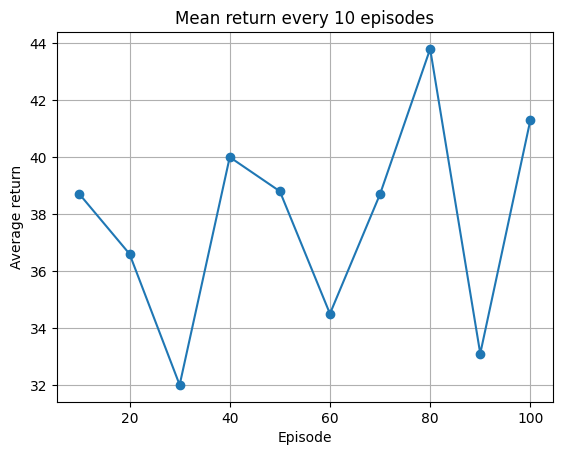

In [35]:
group = 10
num_groups = len(returns) // group
means = [
    np.mean(returns[i*group : (i+1)*group])
    for i in range(num_groups)
]

plt.figure()
plt.plot(np.arange(1, num_groups + 1) * group, means, marker="o")
plt.title(f"Mean return every {group} episodes")
plt.xlabel("Episode")
plt.ylabel("Average return")
plt.grid(True)
plt.show()

### Visualizar el mejor modelo

In [36]:
play_env = make_atari_env(ENV_ID, n_envs=1,seed=best_seed, env_kwargs={"render_mode": "human"})
play_env = VecFrameStack(play_env, n_stack=4)

obs = play_env.reset()
done = False
total_reward = 0.0
while not done:
    action, _ = model.predict(obs, deterministic=True)
    obs, reward, done, _ = play_env.step(action)
    total_reward += float(reward[0])
    play_env.render()
    time.sleep(0.02)

print("Episodio terminado, recompensa acumulada:", total_reward)
play_env.close()

Episodio terminado, recompensa acumulada: 104.0


# Deep Q-Network (DQN)

In [15]:
train_env = make_atari_env(ENV_ID, seed=SEED, n_envs=N_ENVS)
train_env = VecFrameStack(train_env, n_stack=4)

eval_env = make_atari_env(ENV_ID, seed=123, n_envs=N_ENVS)
eval_env = VecFrameStack(eval_env, n_stack=4)

eval_cb = EvalCallback(eval_env, best_model_save_path="../models/dqn",
                       eval_freq=100_000, n_eval_episodes=10,
                       deterministic=True, render=False)

ckpt_cb = CheckpointCallback(save_freq=1_000_000, save_path="../models/dqn/checkpoints",
                             name_prefix="dqn_pacman")

In [16]:
model = DQN(
    policy="CnnPolicy",
    env=train_env,
    learning_rate=lambda f: 2.5e-4 * (1 - f),
    buffer_size=200_000,
    learning_starts=80_000,
    batch_size=32,
    tau=1.0,
    gamma=0.99,
    train_freq=4,
    target_update_interval=4_000,
    exploration_fraction=0.12,
    exploration_final_eps=0.01,
    exploration_initial_eps=1.0,
    verbose=1)

Using cuda device
Wrapping the env in a VecTransposeImage.


c:\Users\Usuario\miniconda3\envs\rf_lab\Lib\site-packages\stable_baselines3\common\buffers.py:242: UserWarning: This system does not have apparently enough memory to store the complete replay buffer 11.29GB > 9.89GB
  warnings.warn(


In [17]:
total_timesteps = 5_000_000
model.learn(total_timesteps=total_timesteps, callback=[eval_cb, ckpt_cb])
model.save(f"../models/dqn/best_model_final.zip")
train_env.close()

c:\Users\Usuario\miniconda3\envs\rf_lab\Lib\site-packages\stable_baselines3\common\callbacks.py:418: UserWarning: Training and eval env are not of the same type<stable_baselines3.common.vec_env.vec_transpose.VecTransposeImage object at 0x0000012148FBBAD0> != <stable_baselines3.common.vec_env.vec_frame_stack.VecFrameStack object at 0x0000011FE2ED83B0>
  warnings.warn("Training and eval env are not of the same type" f"{self.training_env} != {self.eval_env}")


----------------------------------
| rollout/            |          |
|    ep_len_mean      | 1.85e+03 |
|    ep_rew_mean      | 190      |
|    exploration_rate | 0.999    |
| time/               |          |
|    episodes         | 4        |
|    fps              | 907      |
|    time_elapsed     | 0        |
|    total_timesteps  | 642      |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 2.19e+03 |
|    ep_rew_mean      | 275      |
|    exploration_rate | 0.998    |
| time/               |          |
|    episodes         | 8        |
|    fps              | 966      |
|    time_elapsed     | 1        |
|    total_timesteps  | 1378     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 2.14e+03 |
|    ep_rew_mean      | 275      |
|    exploration_rate | 0.997    |
| time/               |          |
|    episodes       

## Medir performance del modelo con evaluate policy

In [19]:
model = DQN.load("../models/dqn/best_model_final.zip")
mean, std = evaluate_policy(model, eval_env, n_eval_episodes=10)
print(f"Return medio: {mean:.0f} ± {std:.0f}")

c:\Users\Usuario\miniconda3\envs\rf_lab\Lib\site-packages\stable_baselines3\common\buffers.py:242: UserWarning: This system does not have apparently enough memory to store the complete replay buffer 11.29GB > 3.18GB
  warnings.warn(


Return medio: 1690 ± 614


## ver ejecuccion

### Buscar mejor el mejor modelo en N episodios

In [ ]:
best_return   = -np.inf
best_actions  = []
best_seed     = None
returns       = []

for ep in range(N_EPISODES):
    eval_env.seed(SEED + ep)
    obs = eval_env.reset()
    done = False
    ep_return = 0.0
    actions   = []

    while not done:
        action, _ = model.predict(obs, deterministic=True)
        obs, reward, done, _ = eval_env.step(action)
        actions.append(int(action))
        ep_return += float(reward[0])

    returns.append(ep_return)
    print(f"Episodio={ep} con reward={ep_return}")
    
    if ep_return > best_return:
        best_return  = ep_return
        best_actions = actions
        best_seed    = SEED + ep
        

print(f"Mejor retorno encontrado: {best_return:.0f} (episodio seed={best_seed})")
eval_env.close()

C:\Users\Usuario\AppData\Local\Temp\ipykernel_10376\3925051757.py:16: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  actions.append(int(action))


Episodio=0 con reward=0.0
Episodio=1 con reward=18.0
Episodio=2 con reward=12.0
Episodio=3 con reward=1.0
Episodio=4 con reward=18.0
Episodio=5 con reward=12.0
Episodio=6 con reward=1.0
Episodio=7 con reward=127.0
Episodio=8 con reward=6.0
Episodio=9 con reward=0.0
Episodio=10 con reward=18.0
Episodio=11 con reward=12.0
Episodio=12 con reward=1.0
Episodio=13 con reward=133.0
Episodio=14 con reward=6.0
Episodio=15 con reward=4.0
Episodio=16 con reward=133.0
Episodio=17 con reward=6.0
Episodio=18 con reward=4.0
Episodio=19 con reward=18.0
Episodio=20 con reward=12.0
Episodio=21 con reward=1.0
Episodio=22 con reward=133.0
Episodio=23 con reward=6.0
Episodio=24 con reward=4.0
Episodio=25 con reward=127.0
Episodio=26 con reward=6.0
Episodio=27 con reward=0.0
Episodio=28 con reward=18.0
Episodio=29 con reward=12.0
Episodio=30 con reward=1.0
Episodio=31 con reward=133.0
Episodio=32 con reward=6.0
Episodio=33 con reward=4.0
Episodio=34 con reward=133.0
Episodio=35 con reward=6.0
Episodio=36 co

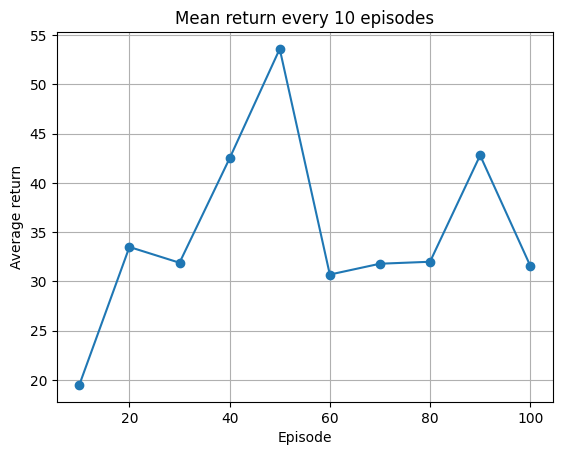

In [29]:
group = 10
num_groups = len(returns) // group
means = [
    np.mean(returns[i*group : (i+1)*group])
    for i in range(num_groups)
]

plt.figure()
plt.plot(np.arange(1, num_groups + 1) * group, means, marker="o")
plt.title(f"Mean return every {group} episodes")
plt.xlabel("Episode")
plt.ylabel("Average return")
plt.grid(True)
plt.show()

### Visualizar el mejor modelo

In [31]:
play_env = make_atari_env(ENV_ID, n_envs=1,seed=best_seed, env_kwargs={"render_mode": "human"})
play_env = VecFrameStack(play_env, n_stack=4)

obs = play_env.reset()
done = False
total_reward = 0.0
while not done:
    action, _ = model.predict(obs, deterministic=True)
    obs, reward, done, _ = play_env.step(action)
    total_reward += float(reward[0])
    play_env.render()
    time.sleep(0.02)

print("Episodio terminado, recompensa acumulada:", total_reward)
play_env.close()

Episodio terminado, recompensa acumulada: 133.0


# Policy Gradient methods (PPO)

In [37]:
train_env = make_atari_env(ENV_ID, seed=SEED, n_envs=N_ENVS)
train_env = VecFrameStack(train_env, n_stack=4)

eval_env = make_atari_env(ENV_ID, seed=123, n_envs=N_ENVS)
eval_env = VecFrameStack(eval_env, n_stack=4)

eval_cb = EvalCallback(eval_env, best_model_save_path="../models/ppo",
                       eval_freq=100_000, n_eval_episodes=10,
                       deterministic=True, render=False)

ckpt_cb = CheckpointCallback(save_freq=1_000_000, save_path="../models/ppo/checkpoints",
                             name_prefix="ppo_pacman")

In [ ]:
model = PPO(
    policy="CnnPolicy",
    env=train_env,
    n_steps=1024,             
    batch_size=256,
    n_epochs=4,
    gamma=0.99,
    gae_lambda=0.95,
    learning_rate=2.5e-4, 
    ent_coef=0.01,
    clip_range=0.1,
    vf_coef=0.5,
    max_grad_norm=0.5,
    verbose=1,
    device="auto"
)

Using cuda device
Wrapping the env in a VecTransposeImage.


In [9]:
total_timesteps = 5_000_000
model.learn(total_timesteps=total_timesteps, callback=[eval_cb, ckpt_cb])
model.save(f"../models/ppo/best_model_final.zip")
train_env.close()

c:\Users\Usuario\miniconda3\envs\rf_lab\Lib\site-packages\stable_baselines3\common\callbacks.py:418: UserWarning: Training and eval env are not of the same type<stable_baselines3.common.vec_env.vec_transpose.VecTransposeImage object at 0x000001D507D11730> != <stable_baselines3.common.vec_env.vec_frame_stack.VecFrameStack object at 0x000001D507C45A60>
  warnings.warn("Training and eval env are not of the same type" f"{self.training_env} != {self.eval_env}")


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 1.86e+03 |
|    ep_rew_mean     | 164      |
| time/              |          |
|    fps             | 812      |
|    iterations      | 1        |
|    time_elapsed    | 1        |
|    total_timesteps | 1024     |
---------------------------------
-------------------------------------------
| rollout/                |               |
|    ep_len_mean          | 1.82e+03      |
|    ep_rew_mean          | 186           |
| time/                   |               |
|    fps                  | 695           |
|    iterations           | 2             |
|    time_elapsed         | 2             |
|    total_timesteps      | 2048          |
| train/                  |               |
|    approx_kl            | 5.5879354e-09 |
|    clip_fraction        | 0             |
|    clip_range           | 2.05e-05      |
|    entropy_loss         | -2.2          |
|    explained_variance   | -0.0246       |


## Medir performance del modelo con evaluate policy

In [38]:
model = PPO.load("../models/ppo/best_model_final.zip")
mean, std = evaluate_policy(model, eval_env, n_eval_episodes=10)
print(f"Return medio: {mean:.0f} ± {std:.0f}")

Return medio: 1112 ± 37


## ver ejecuccion

### Buscar mejor el mejor modelo en N episodios

In [39]:
best_return   = -np.inf
best_actions  = []
best_seed     = None
returns       = []

for ep in range(N_EPISODES):
    eval_env.seed(SEED + ep)
    obs = eval_env.reset()
    done = False
    ep_return = 0.0
    actions   = []

    while not done:
        action, _ = model.predict(obs, deterministic=True)
        obs, reward, done, _ = eval_env.step(action)
        actions.append(int(action))
        ep_return += float(reward[0])

    returns.append(ep_return)
    print(f"Episodio={ep} con reward={ep_return}")
    
    if ep_return > best_return:
        best_return  = ep_return
        best_actions = actions
        best_seed    = SEED + ep
        

print(f"Mejor retorno encontrado: {best_return:.0f} (episodio seed={best_seed})")
eval_env.close()

C:\Users\Usuario\AppData\Local\Temp\ipykernel_10376\4026624940.py:16: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  actions.append(int(action))


Episodio=0 con reward=84.0
Episodio=1 con reward=12.0
Episodio=2 con reward=1.0
Episodio=3 con reward=84.0
Episodio=4 con reward=12.0
Episodio=5 con reward=1.0
Episodio=6 con reward=78.0
Episodio=7 con reward=12.0
Episodio=8 con reward=1.0
Episodio=9 con reward=84.0
Episodio=10 con reward=12.0
Episodio=11 con reward=11.0
Episodio=12 con reward=78.0
Episodio=13 con reward=12.0
Episodio=14 con reward=1.0
Episodio=15 con reward=84.0
Episodio=16 con reward=12.0
Episodio=17 con reward=11.0
Episodio=18 con reward=84.0
Episodio=19 con reward=12.0
Episodio=20 con reward=11.0
Episodio=21 con reward=84.0
Episodio=22 con reward=12.0
Episodio=23 con reward=11.0
Episodio=24 con reward=84.0
Episodio=25 con reward=12.0
Episodio=26 con reward=11.0
Episodio=27 con reward=84.0
Episodio=28 con reward=12.0
Episodio=29 con reward=1.0
Episodio=30 con reward=78.0
Episodio=31 con reward=12.0
Episodio=32 con reward=1.0
Episodio=33 con reward=84.0
Episodio=34 con reward=12.0
Episodio=35 con reward=11.0
Episodio

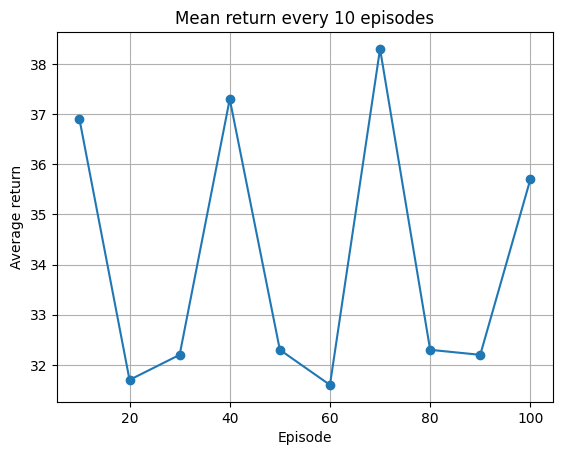

In [40]:
group = 10
num_groups = len(returns) // group
means = [
    np.mean(returns[i*group : (i+1)*group])
    for i in range(num_groups)
]

plt.figure()
plt.plot(np.arange(1, num_groups + 1) * group, means, marker="o")
plt.title(f"Mean return every {group} episodes")
plt.xlabel("Episode")
plt.ylabel("Average return")
plt.grid(True)
plt.show()

### Visualizar el mejor modelo

In [41]:
play_env = make_atari_env(ENV_ID, n_envs=1,seed=best_seed, env_kwargs={"render_mode": "human"})
play_env = VecFrameStack(play_env, n_stack=4)

obs = play_env.reset()
done = False
total_reward = 0.0
while not done:
    action, _ = model.predict(obs, deterministic=True)
    obs, reward, done, _ = play_env.step(action)
    total_reward += float(reward[0])
    play_env.render()
    time.sleep(0.02)

print("Episodio terminado, recompensa acumulada:", total_reward)
play_env.close()

Episodio terminado, recompensa acumulada: 84.0


# Advantage Actor-Critic (A3C)

In [ ]:
env =make_atari_env(
    ENV_ID,
    n_envs=N_ENVS,
    seed=SEED, 
    monitor_dir="../logs/logs_a3c/")

# Aplicar frame-stacking de 4 últimas imágenes (como en DQN de Atari)
env = VecFrameStack(env, n_stack=4)